In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'assignment-4:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F4789028%2F8107838%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240414%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240414T173819Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D471f16a089e62d511c1d3bc1df94f5e9912b6260a54b5a7ae545995b5583f15e80009664657b5b3cc724bd6938d74dc86a4a2bff2a94658701b8cb5f6a309bd85988f1aa20cef3e9c8b839dda4e29e08d2ab83ad4cb90679c32a47e3c77daa4bc9123c3fc076edd917a7e5f93b7bc922ca39c3aa07a2cbab7632f37590da23ce7454cc7990172470033954d41606970663e7eb85bb20097a101caf614dac13a7310c6378a9f5e5f6a7b01b5fdf32a764a2b644eb0367f3ffe6c9127db3763e351df0fcc7cf9e5b74c9618b8fbb19177da8526ac5d1a8ae7b404c309a62eae86c707f6ec5a6b07dd60f9275e2bf58479e89e1ac1a67cad7b1a2b5f5a008ba3334,train-data:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F4789102%2F8107936%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240414%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240414T173819Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D3e8907c3341bdbfde9681fbd86947027f1a77b46aef8a9ed816b0c4f1c0c87cdc95664699c6d390846422e96c0bfedd1ea42360874f60a63c0c925d03783dd605f13df4c082c67b4df6e91112e9e4a8c1713091e85d3c84b3750d479eb3fe75dd4e7a47a517a1ba6788d4da3f8b4c7e0e085c74f7263ae749d91a562e98e447a648c93b621edbe050a68aebeefc07507656ceba48f55a37f60641a882153d91606f0a53a177e1ee593470e567e2c81967f3c13d69f46ecf279a35b2cbe0aca38972c0ab68169ea38000f79fe26dea82e31678165e9edc6fc190fce19609b2205bcc4ecfa43ef1a89c2c52750faed4ade60f0dca657c8fc1e78f0cf31e7342eb7'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


# **Conditional GAN:**
____________________________________

**Installing Libraries:**
__________________________________________

In [ ]:
!pip install wandb

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from torchvision.utils import save_image
from torchvision import utils as vutils
from torchvision.models.inception import inception_v3
from scipy.stats import entropy
from torchvision.datasets import ImageFolder
import zipfile
import io
import wandb
from tqdm import tqdm

**Loading the dataset:**
______________________________________

In [ ]:
import os
os.listdir('/kaggle/input/')

['assignment-4', 'train-data']

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
train_labels = pd.read_csv('/kaggle/input/assignment-4/Assignment_4/Train/Train_labels.csv')
test_labels = pd.read_csv('/kaggle/input/assignment-4/Assignment_4/Test/Test_labels.csv')

**Pre-processing:**
________________________________________

In [ ]:
transform_real = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

transform_sketch = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor()
])

In [ ]:
class PairedImageDataset(Dataset):
    def __init__(self, image_dir, sketch_dir, transform_real, transform_sketch, max_images=None):
        self.image_dir = image_dir
        self.sketch_dir = sketch_dir
        self.image_paths = sorted([fname for fname in os.listdir(image_dir) if fname.endswith(('.png', '.jpg', '.jpeg'))])
        self.sketch_paths = sorted([fname for fname in os.listdir(sketch_dir) if fname.endswith(('.png', '.jpg', '.jpeg'))])
        self.transform_real = transform_real
        self.transform_sketch = transform_sketch
        if max_images is not None:
            self.image_paths = self.image_paths[:max_images]
            self.sketch_paths = self.sketch_paths[:max_images]


    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_name = os.path.join(self.image_dir, self.image_paths[idx])
        sketch_name = os.path.join(self.sketch_dir, self.sketch_paths[idx])
        image = Image.open(img_name).convert('RGB')
        sketch = Image.open(sketch_name).convert('L')
        image = self.transform_real(image)
        sketch = self.transform_sketch(sketch)
        return image, sketch

**Creating Dataset and DataLoader:**
__________________________________________________

In [ ]:
image_extract_dir = '/kaggle/input/train-data/Train_data'
sketch_extract_dir = '/kaggle/input/assignment-4/Assignment_4/Train/Paired_train_sketches/Paired_train_sketches'

image_test_dir = '/kaggle/input/assignment-4/Assignment_4/Test/Test_data/Test_data'
sketch_test_dir = '/kaggle/input/assignment-4/Assignment_4/Test/Paired_test_sketch/Paired_test_sketch'

max_images = 8960
batch_size = 64

train_paired_dataset = PairedImageDataset(image_extract_dir, sketch_extract_dir, transform_real, transform_sketch, max_images)
train_loader = DataLoader(train_paired_dataset, batch_size=batch_size, shuffle=True)

test_paired_dataset = PairedImageDataset(image_test_dir, sketch_test_dir, transform_real, transform_sketch, max_images)
test_loader = DataLoader(test_paired_dataset, batch_size=batch_size, shuffle=False)

**Visualizing Sample Input:**
_________________________________________

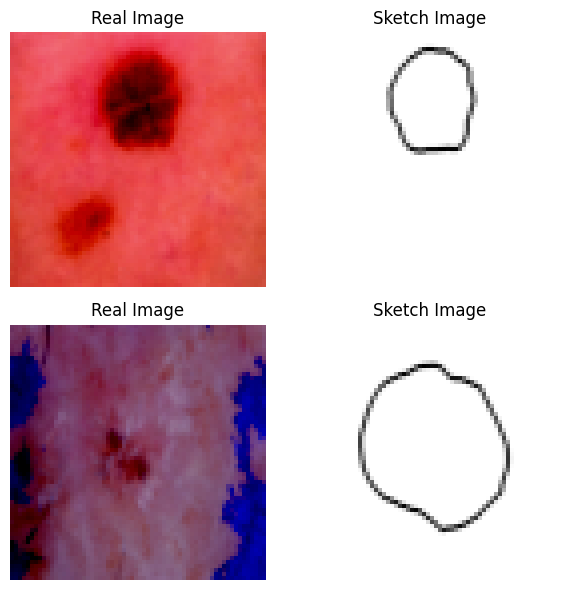

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

real_images, sketch_images = next(iter(train_loader))

def plot_images(real_images, sketch_images):
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(6, 6))
    for i in range(2):
        axes[i, 0].imshow(np.transpose(real_images[i], (1, 2, 0)))
        axes[i, 0].set_title('Real Image')
        axes[i, 0].axis('off')

        axes[i, 1].imshow(sketch_images[i].squeeze(), cmap='gray')
        axes[i, 1].set_title('Sketch Image')
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

plot_images(real_images, sketch_images)

In [ ]:
wandb.init(project="CGAN-Outputs", entity="M23CSA013")

def log_metrics(epoch, batch_idx, d_loss, g_loss):
    wandb.log({
        "epoch": epoch,
        "batch_idx": batch_idx,
        "discriminator_loss": d_loss.item(),
        "generator_loss": g_loss.item()
    })

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


**Generator:**
________________________________________

In [ ]:
class Generator(nn.Module):
    def __init__(self, input_channels, output_channels, hidden_dim=32):
        super(Generator, self).__init__()

        self.encoder = nn.Sequential(
            nn.Conv2d(input_channels, hidden_dim, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(hidden_dim, hidden_dim * 2, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(hidden_dim * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(hidden_dim * 2, hidden_dim * 4, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(hidden_dim * 4),
            nn.LeakyReLU(0.2, inplace=True),
        )

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(hidden_dim * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(hidden_dim * 2, hidden_dim, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(hidden_dim),
            nn.ReLU(True),
            nn.ConvTranspose2d(hidden_dim, output_channels, kernel_size=4, stride=2, padding=1),
            nn.Tanh()
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

**Discriminator:**
___________________________________

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, input_channels, hidden_dim=32):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(input_channels, hidden_dim, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(hidden_dim, hidden_dim * 2, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(hidden_dim * 2, hidden_dim * 4, kernel_size=4, stride=4, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(hidden_dim * 4, 1, kernel_size=4, stride=4, padding=0),  # No padding to ensure output size is 1x1
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.model(x)

**Initialization:**
___________________________________

In [ ]:
# Initialize generator and discriminator
input_channels = 2  # Assuming sketch images are grayscale
output_channels = 3
generator = Generator(input_channels, output_channels).to(device)
input_channels = 3
discriminator = Discriminator(input_channels).to(device)

In [ ]:
import torch.nn.utils as nn_utils

max_grad_norm = 5.0
nn_utils.clip_grad_norm_(generator.parameters(), max_grad_norm)
nn_utils.clip_grad_norm_(discriminator.parameters(), max_grad_norm)

**Loss Function and Optimizer:**
__________________________________________

In [ ]:
num_epochs = 50

criterion = nn.BCELoss()
lr = 0.0002
optimizer_G = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

**Training Loop:**
_________________________________

In [ ]:
num_classes = 7
embedding_dim = 586

embedding = nn.Embedding(num_classes, embedding_dim)

Using 2 GPUs!
Epoch [1/50], Batch [140/140], Discriminator Loss: 1.0867, Generator Loss: 0.9624
Epoch [2/50], Batch [140/140], Discriminator Loss: 1.4868, Generator Loss: 0.8953
Epoch [3/50], Batch [140/140], Discriminator Loss: 1.5619, Generator Loss: 1.1651
Epoch [4/50], Batch [140/140], Discriminator Loss: 1.2254, Generator Loss: 0.9511
Epoch [5/50], Batch [140/140], Discriminator Loss: 1.3882, Generator Loss: 0.7125
Epoch [6/50], Batch [140/140], Discriminator Loss: 1.6168, Generator Loss: 0.8481
Epoch [7/50], Batch [140/140], Discriminator Loss: 1.2836, Generator Loss: 0.8984
Epoch [8/50], Batch [140/140], Discriminator Loss: 0.7847, Generator Loss: 1.2656
Epoch [9/50], Batch [140/140], Discriminator Loss: 1.0813, Generator Loss: 0.9361
Epoch [10/50], Batch [140/140], Discriminator Loss: 1.6007, Generator Loss: 0.8710
Generating images for epoch 10


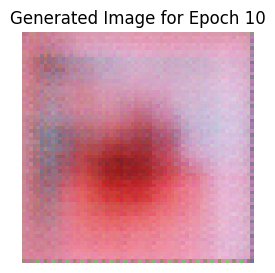

Epoch [11/50], Batch [140/140], Discriminator Loss: 1.1262, Generator Loss: 0.9478
Epoch [12/50], Batch [140/140], Discriminator Loss: 1.1504, Generator Loss: 0.8166
Epoch [13/50], Batch [140/140], Discriminator Loss: 1.1912, Generator Loss: 0.8864
Epoch [14/50], Batch [140/140], Discriminator Loss: 1.2884, Generator Loss: 0.8493
Epoch [15/50], Batch [140/140], Discriminator Loss: 1.2490, Generator Loss: 0.8549
Epoch [16/50], Batch [140/140], Discriminator Loss: 1.1266, Generator Loss: 1.1104
Epoch [17/50], Batch [140/140], Discriminator Loss: 1.0130, Generator Loss: 1.0066
Epoch [18/50], Batch [140/140], Discriminator Loss: 1.1379, Generator Loss: 0.9592
Epoch [19/50], Batch [140/140], Discriminator Loss: 1.0751, Generator Loss: 1.1580
Epoch [20/50], Batch [140/140], Discriminator Loss: 0.9088, Generator Loss: 1.4260
Generating images for epoch 20


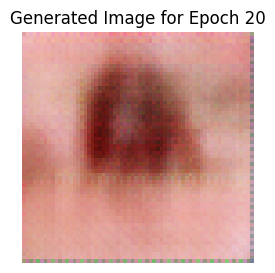

Epoch [21/50], Batch [140/140], Discriminator Loss: 1.0444, Generator Loss: 0.9033
Epoch [22/50], Batch [140/140], Discriminator Loss: 0.9964, Generator Loss: 1.2148
Epoch [23/50], Batch [140/140], Discriminator Loss: 1.1730, Generator Loss: 1.1530
Epoch [24/50], Batch [140/140], Discriminator Loss: 1.2201, Generator Loss: 1.1034
Epoch [25/50], Batch [140/140], Discriminator Loss: 0.9789, Generator Loss: 1.1853
Epoch [26/50], Batch [140/140], Discriminator Loss: 1.0724, Generator Loss: 1.2713
Epoch [27/50], Batch [140/140], Discriminator Loss: 1.1325, Generator Loss: 1.0359
Epoch [28/50], Batch [140/140], Discriminator Loss: 1.1687, Generator Loss: 0.9969
Epoch [29/50], Batch [140/140], Discriminator Loss: 1.2398, Generator Loss: 0.8482
Epoch [30/50], Batch [140/140], Discriminator Loss: 1.2566, Generator Loss: 0.8872
Generating images for epoch 30


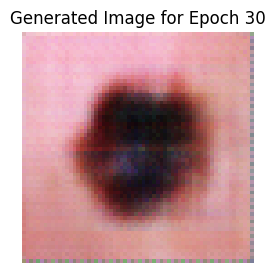

Epoch [31/50], Batch [140/140], Discriminator Loss: 1.1695, Generator Loss: 0.9957
Epoch [32/50], Batch [140/140], Discriminator Loss: 1.3341, Generator Loss: 0.8205
Epoch [33/50], Batch [140/140], Discriminator Loss: 1.3126, Generator Loss: 0.8354
Epoch [34/50], Batch [140/140], Discriminator Loss: 1.1618, Generator Loss: 1.0330
Epoch [35/50], Batch [140/140], Discriminator Loss: 1.2212, Generator Loss: 0.9579
Epoch [36/50], Batch [140/140], Discriminator Loss: 1.2047, Generator Loss: 1.0400
Epoch [37/50], Batch [140/140], Discriminator Loss: 1.1599, Generator Loss: 1.0100
Epoch [38/50], Batch [140/140], Discriminator Loss: 1.0844, Generator Loss: 1.0969
Epoch [39/50], Batch [140/140], Discriminator Loss: 1.0885, Generator Loss: 1.3280
Epoch [40/50], Batch [140/140], Discriminator Loss: 1.1261, Generator Loss: 0.9859
Generating images for epoch 40


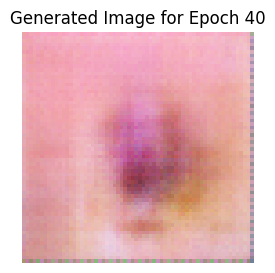

Epoch [41/50], Batch [140/140], Discriminator Loss: 1.1302, Generator Loss: 1.0122
Epoch [42/50], Batch [140/140], Discriminator Loss: 1.2301, Generator Loss: 1.1644
Epoch [43/50], Batch [140/140], Discriminator Loss: 1.1722, Generator Loss: 1.0518
Epoch [44/50], Batch [140/140], Discriminator Loss: 1.0681, Generator Loss: 1.1282
Epoch [45/50], Batch [140/140], Discriminator Loss: 1.0393, Generator Loss: 1.1339
Epoch [46/50], Batch [140/140], Discriminator Loss: 1.2041, Generator Loss: 1.1014
Epoch [47/50], Batch [140/140], Discriminator Loss: 1.0183, Generator Loss: 1.1235
Epoch [48/50], Batch [140/140], Discriminator Loss: 1.1168, Generator Loss: 0.9065
Epoch [49/50], Batch [140/140], Discriminator Loss: 1.2349, Generator Loss: 0.9976
Epoch [50/50], Batch [140/140], Discriminator Loss: 1.1143, Generator Loss: 1.1254
Generating images for epoch 50


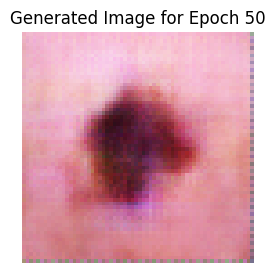

In [ ]:
import torch.nn.functional as F

if torch.cuda.device_count() > 1:
    print("Using", torch.cuda.device_count(), "GPUs!")
    generator = nn.DataParallel(generator)
    discriminator = nn.DataParallel(discriminator)

for epoch in range(num_epochs):
    for i, (real_images, sketch_images) in enumerate(train_loader):
        real_images = real_images.to(device)
        sketch_images = sketch_images.to(device)
        batch_labels = train_labels.iloc[i * batch_size: (i + 1) * batch_size, 1:]

        one_hot_labels = torch.tensor(batch_labels.values, dtype=torch.long)

        embedded_labels = embedding(one_hot_labels).to(device)
        embedded_labels_list = embedded_labels.view(-1).tolist()

        num_to_remove = 384

        indices_to_remove = torch.randperm(embedded_labels.numel())[:num_to_remove]

        embedded_labels_list = [value for index, value in enumerate(embedded_labels_list) if index not in indices_to_remove]
        embedded_labels = torch.tensor(embedded_labels_list).view(batch_size, 1, 64, 64).to(device)  # Move to the GPU

        concatenated_images = torch.cat((sketch_images, embedded_labels), dim=1)

        fake_images = generator(concatenated_images)

        optimizer_D.zero_grad()

        real_outputs = discriminator(real_images)
        d_loss_real = criterion(real_outputs, torch.ones_like(real_outputs))

        fake_images_resized = F.interpolate(fake_images, size=real_images.size()[2:], mode='bilinear', align_corners=False)
        fake_outputs = discriminator(fake_images_resized.detach())
        d_loss_fake = criterion(fake_outputs, torch.zeros_like(fake_outputs))

        d_loss = d_loss_real + d_loss_fake
        d_loss.backward()
        optimizer_D.step()

        optimizer_G.zero_grad()
        fake_outputs = discriminator(fake_images_resized)
        g_loss = criterion(fake_outputs, torch.ones_like(fake_outputs))
        g_loss.backward()
        optimizer_G.step()

        if (i + 1) % 140 == 0:
            print(f"Epoch [{epoch + 1}/{num_epochs}], Batch [{i + 1}/{len(train_loader)}], "
                  f"Discriminator Loss: {d_loss.item():.4f}, Generator Loss: {g_loss.item():.4f}")

            log_metrics(epoch, i, d_loss, g_loss)

    if (epoch + 1) % 10 == 0:
        print(f"Generating images for epoch {epoch + 1}")
        plt.figure(figsize=(6, 3))
        fake_images=(fake_images+1)/2
        one_image = fake_images[0].cpu().detach().permute(1, 2, 0)

        plt.imshow(one_image)
        plt.axis('off')
        plt.title(f'Generated Image for Epoch {epoch+1}')
        plt.show()

    log_metrics(epoch, i, d_loss, g_loss)

**Saving the models:**
___________________________________________________

In [ ]:
generator_path = '/kaggle/working/generator_weight.pth'
discriminator_path = '/kaggle/working/discriminator_weight.pth'

torch.save(generator.state_dict(), generator_path)
torch.save(discriminator.state_dict(), discriminator_path)

print("Model weights saved.")

Model weights saved.


**Visualization:**
_______________________________________

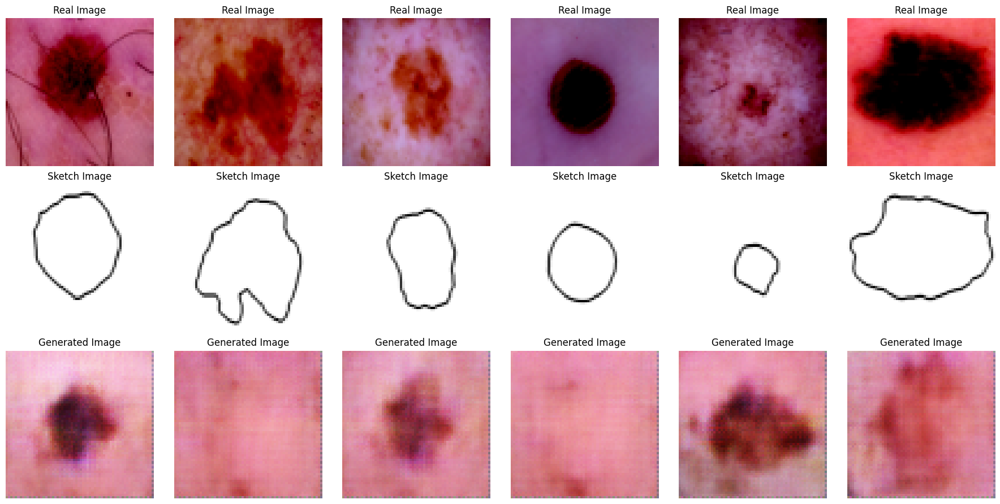

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import torch

def plot_images_grid(real_images, sketch_images, generated_images):
    fig, axes = plt.subplots(nrows=3, ncols=6, figsize=(18, 9))

    for i in range(6):
        axes[0, i].imshow(np.transpose(real_images[i].cpu().detach().numpy(), (1, 2, 0)))
        axes[0, i].set_title('Real Image')
        axes[0, i].axis('off')

        axes[1, i].imshow(sketch_images[i].cpu().detach().numpy().squeeze(), cmap='gray')
        axes[1, i].set_title('Sketch Image')
        axes[1, i].axis('off')

        axes[2, i].imshow(np.transpose(generated_images[i].cpu().detach().numpy(), (1, 2, 0)))
        axes[2, i].set_title('Generated Image')
        axes[2, i].axis('off')

    plt.tight_layout()
    plt.show()

plot_images_grid(real_images, sketch_images, fake_images)

**Generating Images for each class:**
__________________________________________________

In [ ]:
def plot_class(real_images, sketch_images, generated_images, num_images_per_class=10, target_class=None):
    fig, axes = plt.subplots(nrows=3, ncols=num_images_per_class, figsize=(18, 9))

    num_classes = 7

    class_idx = target_class
    class_real_images = real_images[class_idx::num_classes][:num_images_per_class]
    class_sketch_images = sketch_images[class_idx::num_classes][:num_images_per_class]
    class_generated_images = generated_images[class_idx::num_classes][:num_images_per_class]

    target_header = f'Target Class: {class_idx}'

    for i in range(num_images_per_class):
        axes[0, i].imshow(np.transpose(class_real_images[i].cpu().detach().numpy(), (1, 2, 0)))
        axes[0, i].set_title('Real Image')
        axes[0, i].axis('off')

        axes[1, i].imshow(class_sketch_images[i].cpu().detach().numpy().squeeze(), cmap='gray')
        axes[1, i].set_title('Sketch Image')
        axes[1, i].axis('off')

        axes[2, i].imshow(np.transpose(class_generated_images[i].cpu().detach().numpy(), (1, 2, 0)))
        axes[2, i].set_title('Generated Image')
        axes[2, i].axis('off')

    fig.suptitle(target_header, fontsize=16)
    plt.tight_layout()
    plt.show()

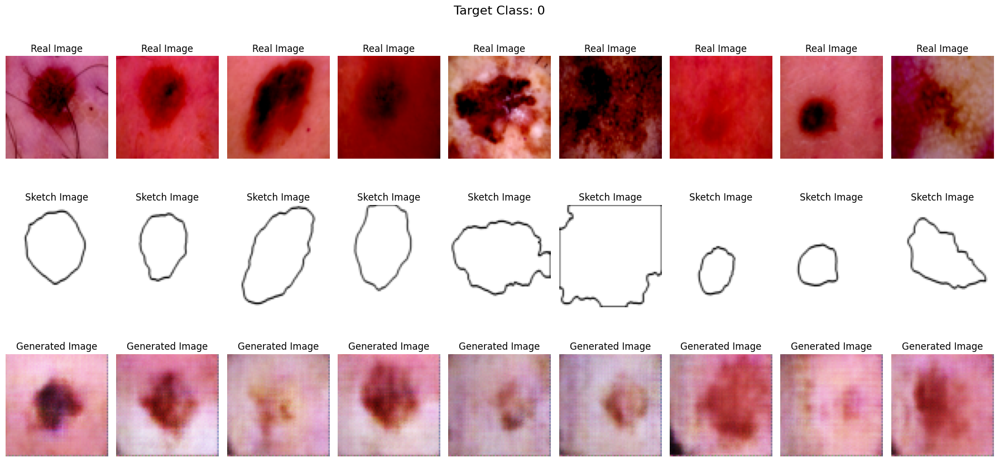

In [ ]:
plot_class(real_images, sketch_images, fake_images, num_images_per_class=9, target_class=0)

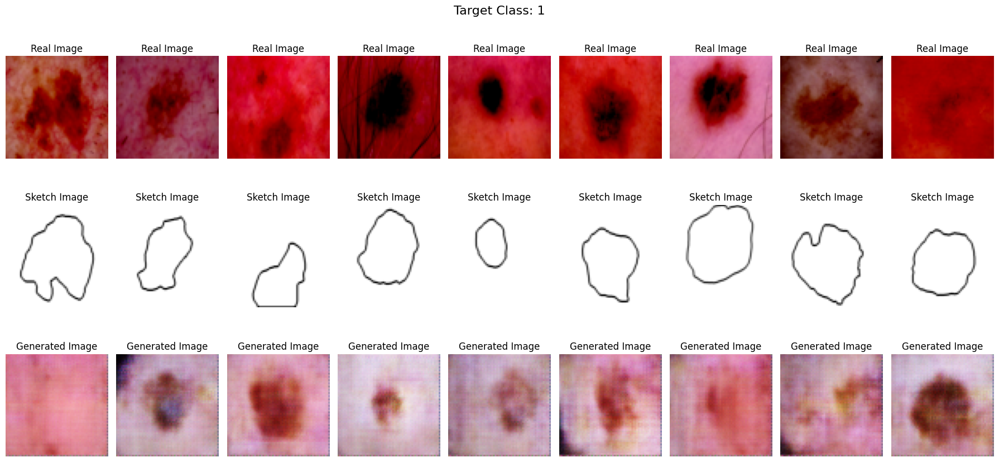

In [ ]:
plot_class(real_images, sketch_images, fake_images, num_images_per_class=9, target_class=1)

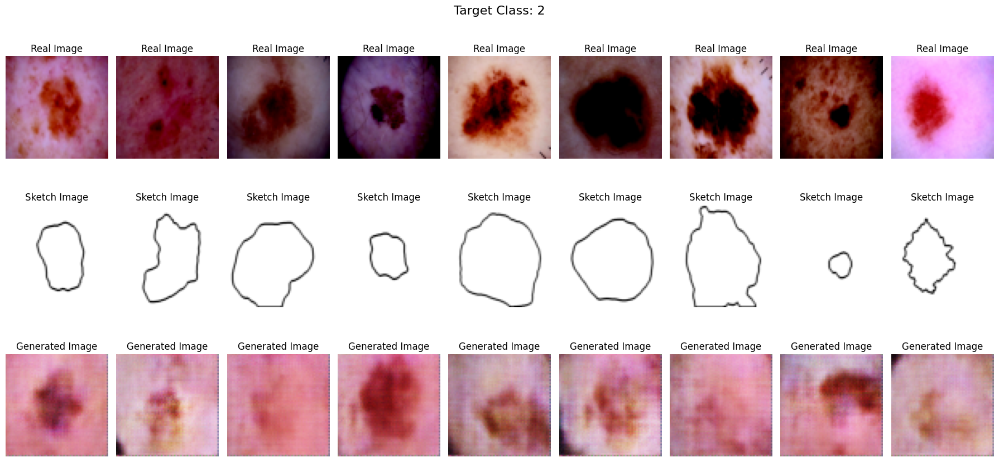

In [ ]:
plot_class(real_images, sketch_images, fake_images, num_images_per_class=9, target_class=2)

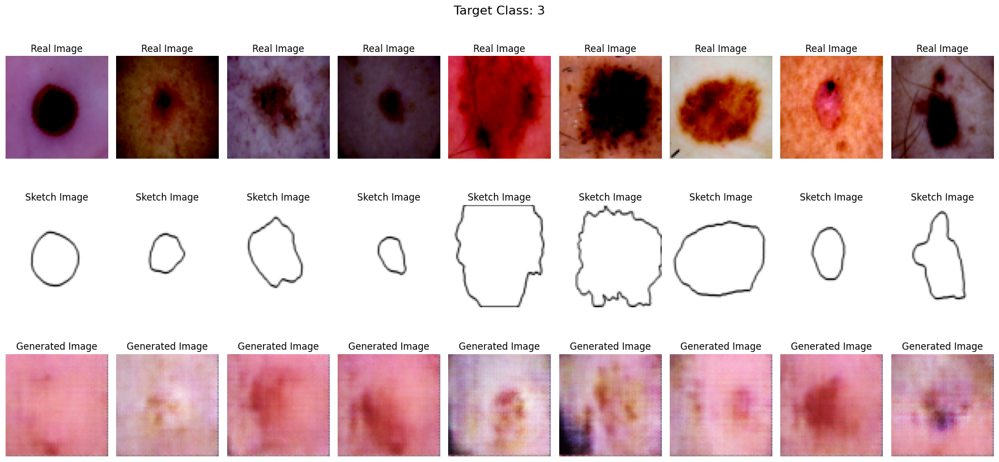

In [ ]:
plot_class(real_images, sketch_images, fake_images, num_images_per_class=9, target_class=3)

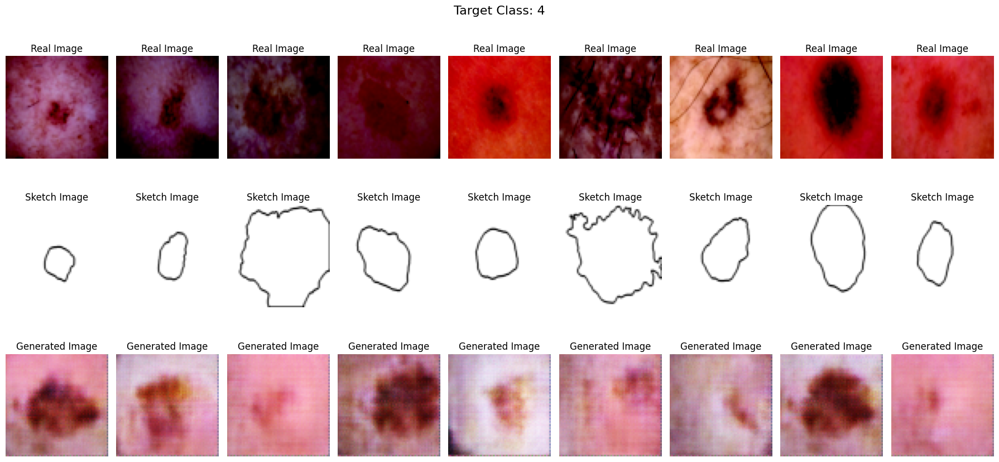

In [ ]:
plot_class(real_images, sketch_images, fake_images, num_images_per_class=9, target_class=4)

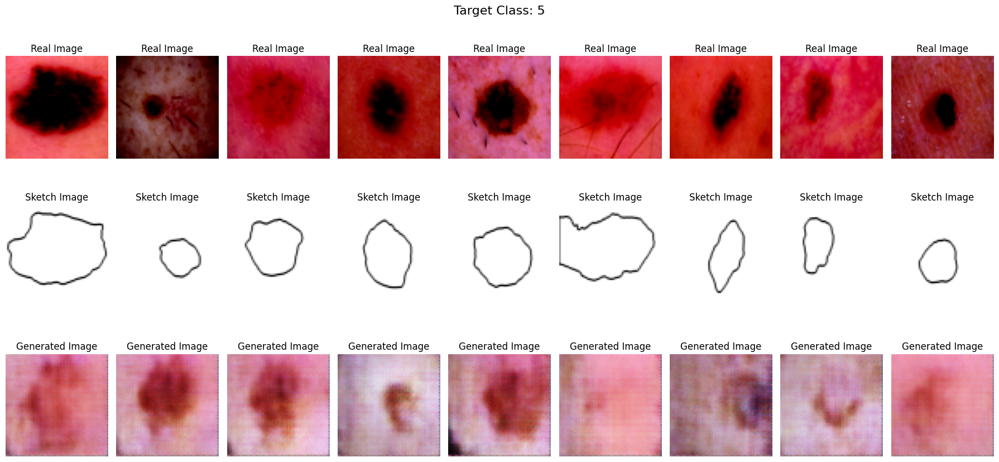

In [ ]:
plot_class(real_images, sketch_images, fake_images, num_images_per_class=9, target_class=5)

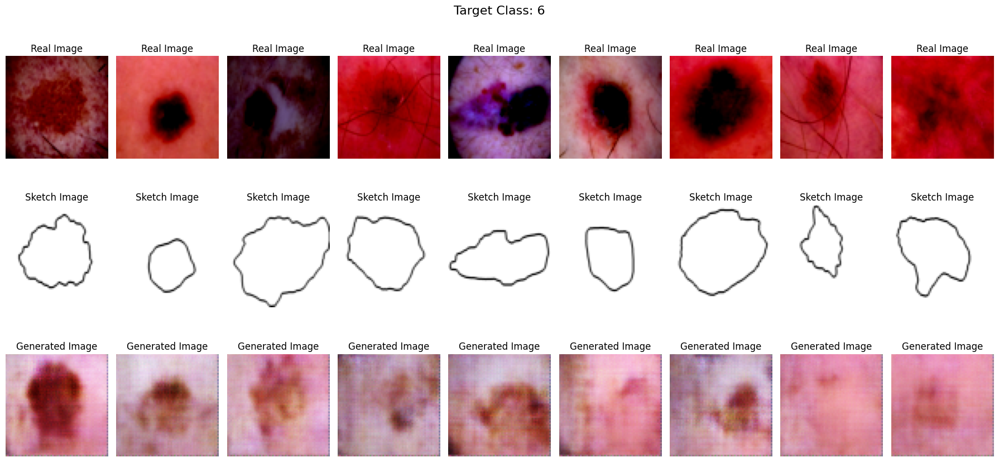

In [ ]:
plot_class(real_images, sketch_images, fake_images, num_images_per_class=9, target_class=6)

**Testing Loop:**
____________________________

In [ ]:
image_test_dir = '/kaggle/input/assignment-4/Assignment_4/Test/Test_data/Test_data'
sketch_test_dir = '/kaggle/input/assignment-4/Assignment_4/Test/Paired_test_sketch/Paired_test_sketch'

max_images_test = 960

test_paired_dataset = PairedImageDataset(image_test_dir, sketch_test_dir, transform_real, transform_sketch, max_images_test)
test_loader = DataLoader(test_paired_dataset, batch_size=batch_size, shuffle=False)

In [ ]:
real_images_dir = '/real_images'
fake_images_dir = '/fake_images'
os.makedirs(real_images_dir, exist_ok=True)
os.makedirs(fake_images_dir, exist_ok=True)

In [ ]:
!pip install torch-fidelity

In [ ]:
import torchvision
from torch_fidelity import calculate_metrics
from torchvision import utils

generator.eval()

for i, (real_images, sketch_images) in enumerate(test_loader):

    real_images = real_images.to(device)
    sketch_images = sketch_images.to(device)
    batch_labels = test_labels.iloc[i * batch_size: (i + 1) * batch_size, 1:]

    one_hot_labels = torch.tensor(batch_labels.values, dtype=torch.long)

    embedded_labels = embedding(one_hot_labels)
    num_to_remove = 384

    indices_to_remove = torch.randperm( embedded_labels.numel()) [:num_to_remove]

    embedded_labels_list = embedded_labels.view(-1).tolist()
    embedded_labels_list = [value for index, value in enumerate(embedded_labels_list) if index not in indices_to_remove]

    embedded_labels = torch.tensor(embedded_labels_list).view(batch_size, 1, 64, 64)

    concatenated_images = torch.cat((sketch_images, embedded_labels.to(device)), dim=1)
    with torch.no_grad():
        fake_images = generator(concatenated_images)
        fake_images_resized = F.interpolate(fake_images, size=(64, 64), mode='bilinear', align_corners=False)
        fake_images_resized = fake_images_resized.to(device)

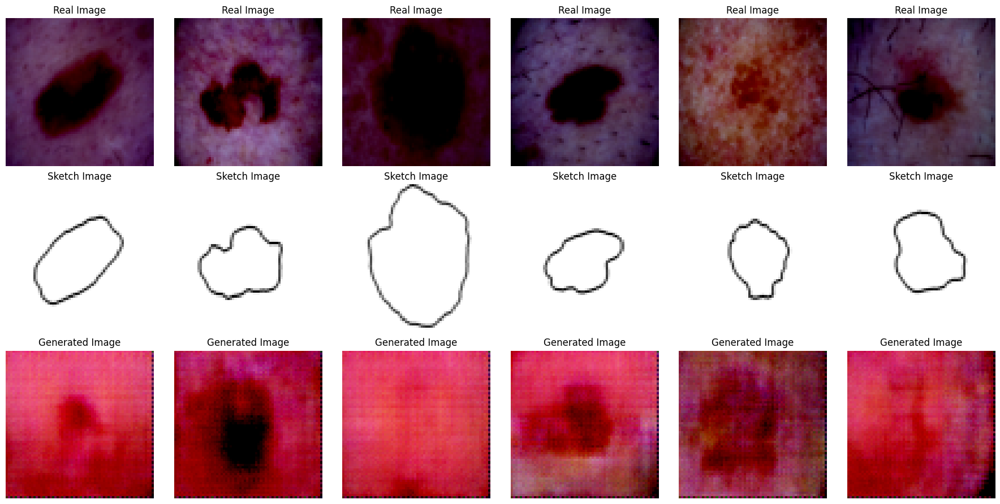

In [ ]:
plot_images_grid(real_images, sketch_images, fake_images)

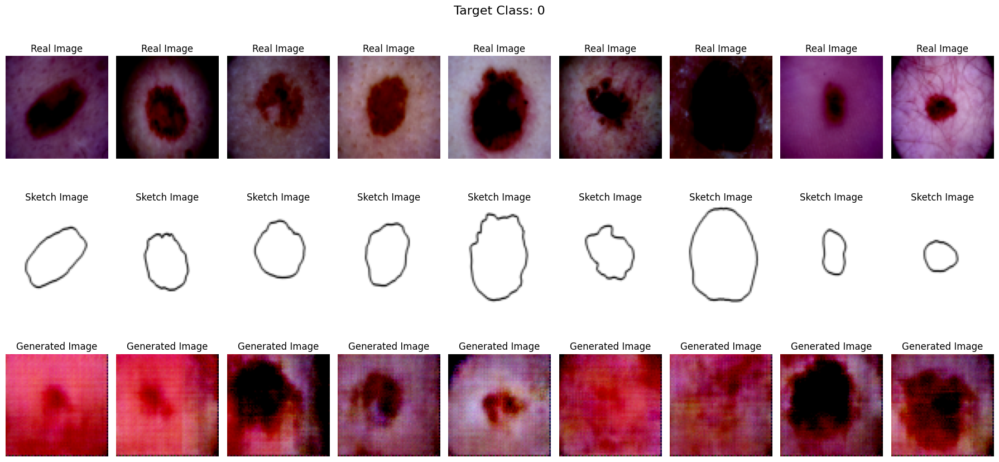

In [ ]:
plot_class(real_images, sketch_images, fake_images, num_images_per_class=9, target_class=0)

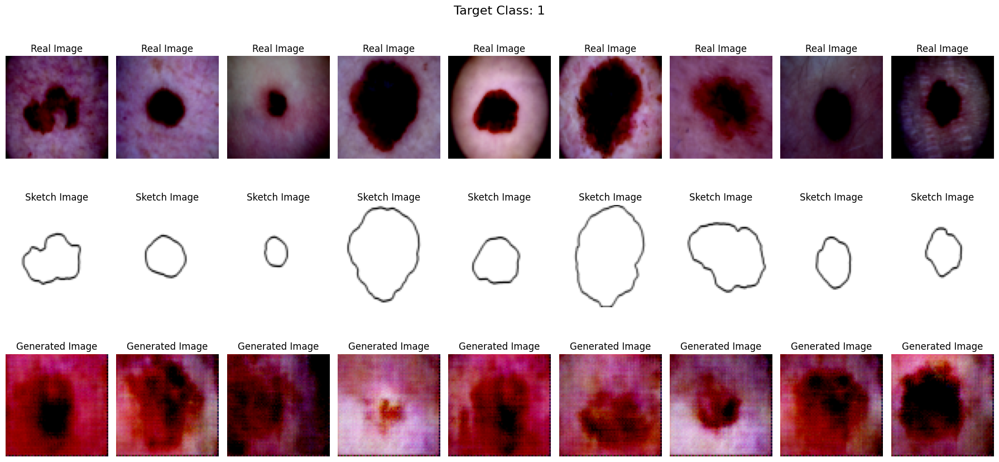

In [ ]:
plot_class(real_images, sketch_images, fake_images, num_images_per_class=9, target_class=1)

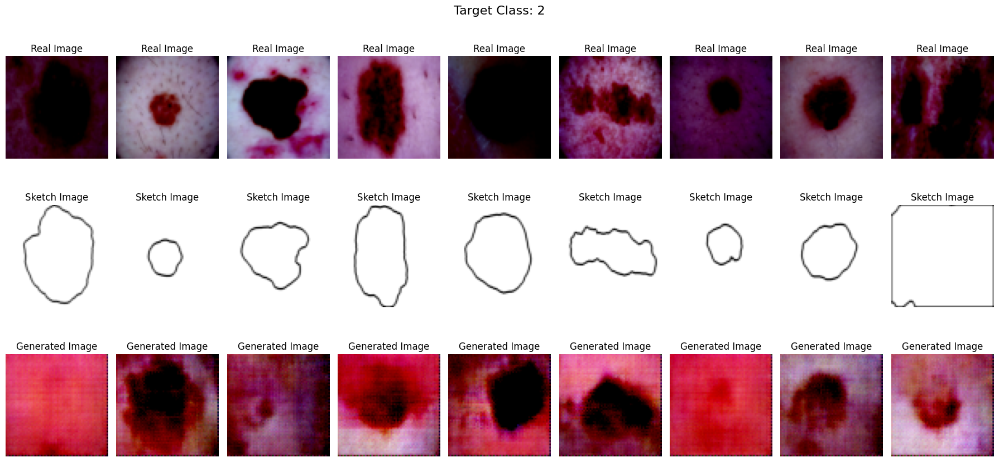

In [ ]:
plot_class(real_images, sketch_images, fake_images, num_images_per_class=9, target_class=2)

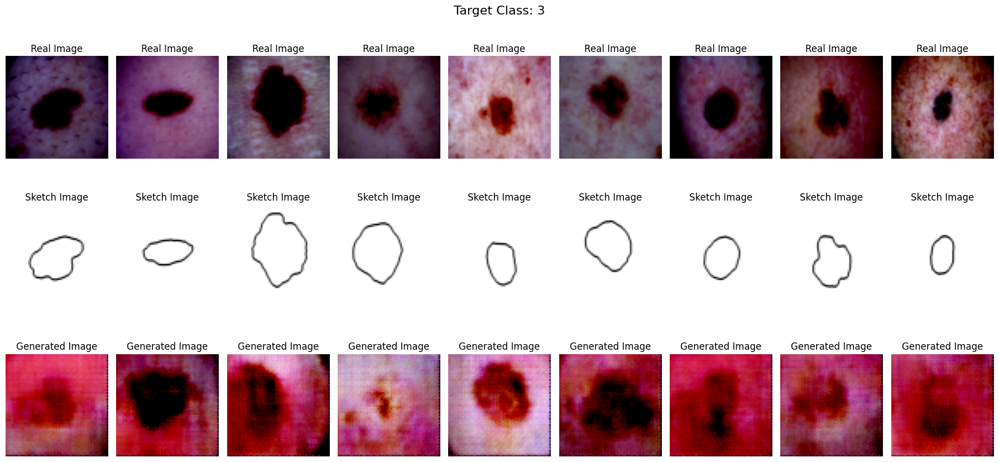

In [ ]:
plot_class(real_images, sketch_images, fake_images, num_images_per_class=9, target_class=3)

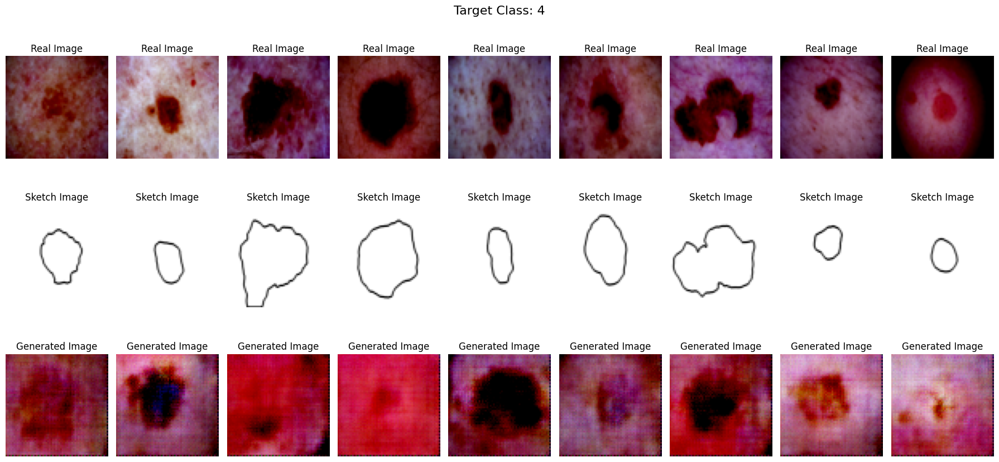

In [ ]:
plot_class(real_images, sketch_images, fake_images, num_images_per_class=9, target_class=4)

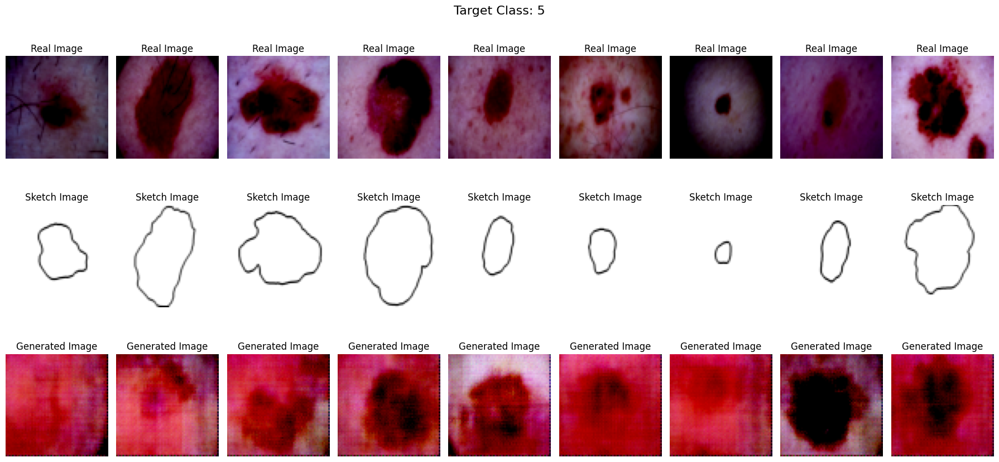

In [ ]:
plot_class(real_images, sketch_images, fake_images, num_images_per_class=9, target_class=5)

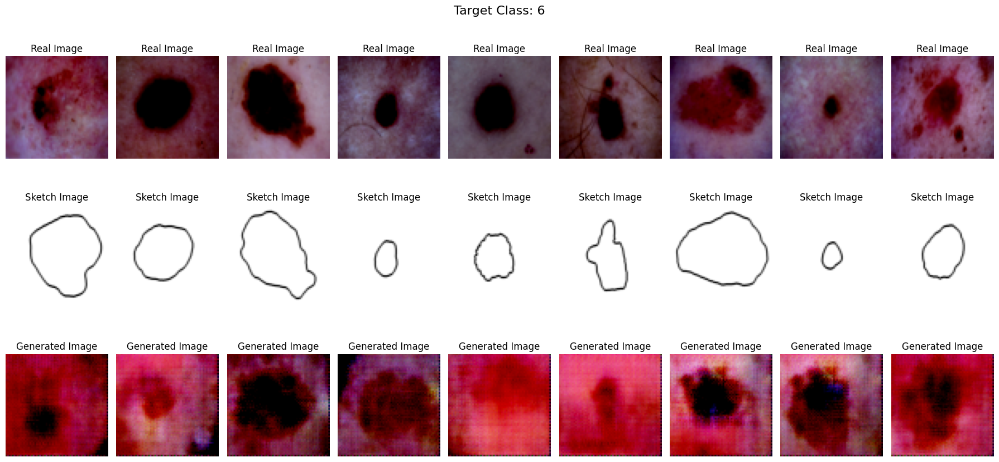

In [ ]:
plot_class(real_images, sketch_images, fake_images, num_images_per_class=9, target_class=6)

**FID Score and IS Score:**
________________________________________

In [ ]:
real_images_dir = '/real_images'
fake_images_dir = '/fake_images'
os.makedirs(real_images_dir, exist_ok=True)
os.makedirs(fake_images_dir, exist_ok=True)

In [ ]:
import torchvision
from torch_fidelity import calculate_metrics
from torchvision import utils
from torchvision.utils import save_image

generator.eval()

for i, (real_images, sketch_images) in enumerate(test_loader):

    real_images = real_images.to(device)
    sketch_images = sketch_images.to(device)
    batch_labels = test_labels.iloc[i * batch_size: (i + 1) * batch_size, 1:]

    one_hot_labels = torch.tensor(batch_labels.values, dtype=torch.long)

    embedded_labels = embedding(one_hot_labels)
    num_to_remove = 384

    indices_to_remove = torch.randperm( embedded_labels.numel()) [:num_to_remove]

    embedded_labels_list = embedded_labels.view(-1).tolist()
    embedded_labels_list = [value for index, value in enumerate(embedded_labels_list) if index not in indices_to_remove]

    embedded_labels = torch.tensor(embedded_labels_list).view(batch_size, 1, 64, 64)

    concatenated_images = torch.cat((sketch_images, embedded_labels.to(device)), dim=1)
    with torch.no_grad():
        fake_images = generator(concatenated_images)
        fake_images_resized = F.interpolate(fake_images, size=(64, 64), mode='bilinear', align_corners=False)
        fake_images_resized = fake_images_resized.to(device)
        for j in range(fake_images_resized.shape[0]):
            fake_image_path = os.path.join("/kaggle/working/fake_images", f'fake_image_{i * batch_size + j}.png')
            torchvision.utils.save_image(fake_images_resized[j],fake_image_path)

        for j in range(real_images.shape[0]):
            real_image_path = os.path.join("/kaggle/working/real_images", f'real_image_{i * batch_size + j}.png')
            torchvision.utils.save_image(real_images[j],  real_image_path)

In [ ]:
metrics = calculate_metrics(input1='/kaggle/working/real_images', input2='/kaggle/working/fake_images', cuda=True, isc=True)
print("Inception Score:", metrics['inception_score_mean'])

Creating feature extractor "inception-v3-compat" with features ['logits_unbiased']
Extracting features from input1
Looking for samples non-recursivelty in "/kaggle/working/real_images" with extensions png,jpg,jpeg
Found 960 samples
/opt/conda/lib/python3.10/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)
Processing samples                                                         
Extracting features from input2
Looking for samples non-recursivelty in "/kaggle/working/fake_images" with extensions png,jpg,jpeg
Found 960 samples
Processing samples                                                         


Inception Score: 3.1537222416591257


Inception Score: 3.1537222416591257 ± 0.20600955474235355


# **CNN**:
____________________________________

In [ ]:
class ISICDataset_CNN(Dataset):
    def __init__(self, image_folder, labels_file, transform=None):
        self.image_folder = image_folder
        self.labels = pd.read_csv(labels_file)
        self.transform = transform

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        img_name = os.path.join(self.image_folder, self.labels.iloc[idx, 0] + '.jpg')
        image = Image.open(img_name)
        label = self.labels.iloc[idx, 1:].values.astype(np.float32)

        if self.transform:
            image = self.transform(image)

        return image, label

In [ ]:
transform_cnn = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

In [ ]:
train_image_folder = '/kaggle/input/train-data/Train_data'
train_labels_file = '/kaggle/input/assignment-4/Assignment_4/Train/Train_labels.csv'
test_image_folder = '/kaggle/input/assignment-4/Assignment_4/Test/Test_data/Test_data'
test_labels_file = '/kaggle/input/assignment-4/Assignment_4/Test/Test_labels.csv'

train_cnn = ISICDataset_CNN(train_image_folder, train_labels_file, transform=transform_cnn)
test_cnn = ISICDataset_CNN(test_image_folder, test_labels_file, transform=transform_cnn)
train_cnnloader = DataLoader(train_cnn, batch_size=32, shuffle=True)
test_cnnloader = DataLoader(test_cnn, batch_size=32, shuffle=False)

In [ ]:
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, 3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, 3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.fc1 = nn.Linear(64 * 16 * 16, 128)
        self.fc2 = nn.Linear(128, 7)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 64 * 16 * 16)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x

In [ ]:
model_cnn = CNN().to(device)

In [ ]:
optimizer_cnn = optim.Adam(model_cnn.parameters(),lr=0.001)
criterion_cnn = nn.CrossEntropyLoss()
num_epochs = 20

In [ ]:
def train_cnn(model, dataloader, criterion, optimizer, device):
    model.train()
    running_loss = 0.0
    correct_preds = 0
    total_preds = 0

    for images, labels in dataloader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels.float())  # Convert labels to float
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        _, predicted = torch.max(outputs, 1)
        correct_preds += (predicted == torch.max(labels, 1)[1]).sum().item()
        total_preds += labels.size(0)

    epoch_loss = running_loss / total_preds
    epoch_acc = (correct_preds / total_preds) * 100.0

    return epoch_loss, epoch_acc

for epoch in range(num_epochs):
    train_loss, train_acc = train_cnn(model_cnn, train_cnnloader, criterion_cnn, optimizer_cnn, device)
    print(f"Epoch {epoch+1}/{num_epochs}, CNN Train Loss: {train_loss:.4f}, CNN Train Acc: {train_acc:.2f}%")
    wandb.log({"CNN Train Loss": train_loss, "CNN Train Accuracy": train_acc})
    plt.close()

Epoch 1/20, CNN Train Loss: 0.8434, CNN Train Acc: 70.70%
Epoch 2/20, CNN Train Loss: 0.6961, CNN Train Acc: 74.23%
Epoch 3/20, CNN Train Loss: 0.6265, CNN Train Acc: 77.04%
Epoch 4/20, CNN Train Loss: 0.5665, CNN Train Acc: 79.29%
Epoch 5/20, CNN Train Loss: 0.5018, CNN Train Acc: 81.32%
Epoch 6/20, CNN Train Loss: 0.4305, CNN Train Acc: 83.98%
Epoch 7/20, CNN Train Loss: 0.3760, CNN Train Acc: 86.13%
Epoch 8/20, CNN Train Loss: 0.3106, CNN Train Acc: 89.02%
Epoch 9/20, CNN Train Loss: 0.2474, CNN Train Acc: 90.97%
Epoch 10/20, CNN Train Loss: 0.1841, CNN Train Acc: 93.73%
Epoch 11/20, CNN Train Loss: 0.1443, CNN Train Acc: 95.05%
Epoch 12/20, CNN Train Loss: 0.1053, CNN Train Acc: 96.24%
Epoch 13/20, CNN Train Loss: 0.0876, CNN Train Acc: 97.03%
Epoch 14/20, CNN Train Loss: 0.0553, CNN Train Acc: 98.35%
Epoch 15/20, CNN Train Loss: 0.0656, CNN Train Acc: 97.91%
Epoch 16/20, CNN Train Loss: 0.0581, CNN Train Acc: 98.09%
Epoch 17/20, CNN Train Loss: 0.0308, CNN Train Acc: 99.06%
Epoch 

In [ ]:
def test_cnn(model, dataloader, criterion, device):
    model.eval()
    running_loss = 0.0
    correct_preds = 0
    total_preds = 0

    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels.float())  # Convert labels to float

            running_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)
            correct_preds += (predicted == torch.max(labels, 1)[1]).sum().item()
            total_preds += labels.size(0)

    test_loss = running_loss / total_preds
    test_acc = (correct_preds / total_preds) * 100.0

    return test_loss, test_acc

test_loss, test_acc = test_cnn(model_cnn, test_cnnloader, criterion_cnn, device)
print(f"CNN Test Loss: {test_loss:.4f}, CNN Test Acc: {test_acc:.2f}%")
wandb.log({"CNN Test Loss": test_loss, "CNN Test Accuracy": test_acc})

CNN Test Loss: 2.6649, CNN Test Acc: 54.70%


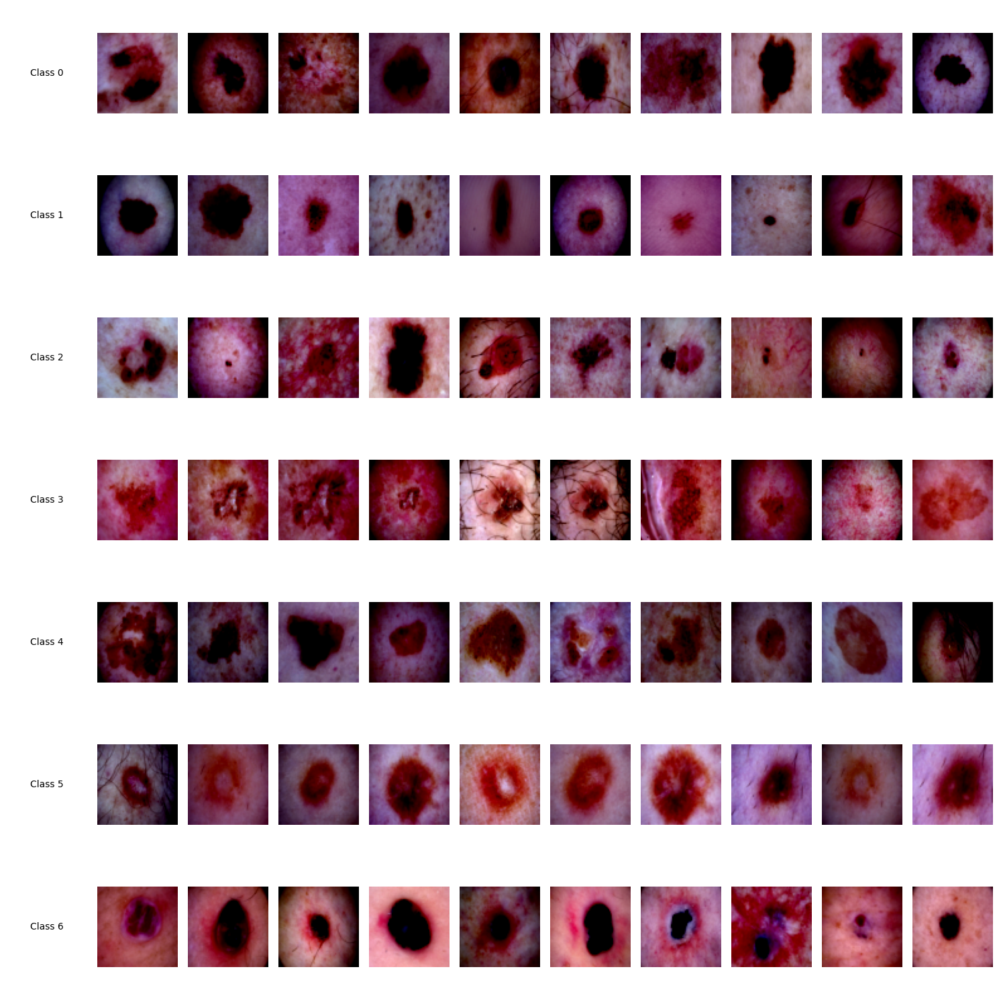

In [ ]:
def plot_images_by_class(model, dataloader, device):
    model.eval()
    class_images = {i: [] for i in range(7)}

    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)

            for i in range(len(labels)):
                label = labels[i].argmax().item()
                if len(class_images[label]) < 10:
                    class_images[label].append(images[i])

    plt.figure(figsize=(15, 15))
    for i in range(7):
        plt.subplot(7, 11, i*11 + 1)
        plt.text(0.5, 0.5, f"Class {i}", ha='center', va='center', fontsize=10, color='black')
        plt.axis('off')
        for j in range(10):
            plt.subplot(7, 11, i*11 + j + 2)
            if j < len(class_images[i]):
                plt.imshow(class_images[i][j].cpu().numpy().transpose((1, 2, 0)))
            plt.axis('off')
    plt.tight_layout()
    plt.show()

plot_images_by_class(model_cnn, test_cnnloader, device)